In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import torch
import os
import tqdm
from PIL import Image
import IPython.display as ipd

In [ ]:
df = pd.read_csv('mot_labels.csv')
df.head()

/home/ubuntu/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
0,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89537.0,car,False,True,False,825.173210,1003.094688,355.011547,418.198614,True
1,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89538.0,car,False,True,False,484.295612,700.461894,346.697460,424.849885,True
2,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89539.0,pedestrian,False,True,False,645.588915,663.879908,338.383372,358.337182,True
3,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89540.0,car,False,False,False,120.969977,192.471132,359.168591,409.053118,True
4,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89541.0,car,False,False,False,251.501155,315.519630,354.180139,400.739030,True


In [ ]:
df.shape

(2890846, 13)

In [ ]:
df.columns

Index(['name', 'videoName', 'frameIndex', 'id', 'category', 'attributes.crowd',
       'attributes.occluded', 'attributes.truncated', 'box2d.x1', 'box2d.x2',
       'box2d.y1', 'box2d.y2', 'haveVideo'],
      dtype='object')

In [ ]:
df.nunique()

name                     278079
videoName                  1400
frameIndex                  263
id                       112819
category                     11
attributes.crowd              2
attributes.occluded           2
attributes.truncated          2
box2d.x1                1109524
box2d.x2                 972595
box2d.y1                 865145
box2d.y2                 737474
haveVideo                     2
dtype: int64

In [ ]:
df[df['haveVideo'] == False].nunique()

name                     87610
videoName                  439
frameIndex                 246
id                       36934
category                    11
attributes.crowd             2
attributes.occluded          2
attributes.truncated         2
box2d.x1                491660
box2d.x2                438134
box2d.y1                388573
box2d.y2                339012
haveVideo                    1
dtype: int64

In [ ]:
df['category'].value_counts()

car              2207116
pedestrian        381441
truck             149823
bus                57880
bicycle            28477
rider              20365
other vehicle      19202
motorcycle         12464
other person        4453
trailer             4103
train               1592
Name: category, dtype: int64

In [ ]:
movie_files = os.listdir('bdd100k_videos_train_00/bdd100k/videos/train')
len(movie_files)

1000

In [ ]:
movies_in_df = list(df['videoName'].unique())

In [ ]:
movies_given = [s[:-4] for s in movie_files]

In [ ]:
movie_mismatch = []
for m in movies_in_df:
    if m not in movies_given:
        movie_mismatch.append(m)
        
movie_mismatch2 = []
for m in movies_given:
    if m not in movies_in_df:
        movie_mismatch2.append(m)

In [ ]:
len(movie_mismatch), len(movie_mismatch2)

(439, 39)

In [ ]:
movie_mismatch2

['013742f1-3a043a4e',
 '00ca8821-17667a58',
 '0081e3ea-cc69a1c4',
 '0114bdd0-f317da84',
 '022aca7c-9e9a3905',
 '025337f4-9404c4de',
 '02621ea2-399eaeb2',
 '025f49ef-0f6366f3',
 '007eddfc-f8a80310',
 '01c231b4-1ebf841a',
 '00495359-1d04dd8a',
 '025ed087-7cb7665c',
 '028a3713-d915c80e',
 '025b2ded-11363432',
 '025ecc28-3d894af1',
 '00cea101-293a30b5',
 '00e5e793-22614772',
 '0004974f-05e1c285',
 '02065c11-0966f65d',
 '0256f56a-35c8e2fe',
 '025bff9b-cd0b388b',
 '025ce5d9-afedd5c5',
 '0204aad7-4ebd19fa',
 '002f8552-0cdd55c6',
 '025b2ded-47ac9b1d',
 '02b7b9ee-60bfd818',
 '01306b58-1c8ac4c9',
 '025701a5-b1eb8111',
 '0060b445-5acc00ed',
 '025b2ded-0f6cbb6b',
 '02621ea2-e25d54a0',
 '025b2ded-1b0c1607',
 '025b2ded-de608724',
 '02537d58-3972c3e7',
 '0263a45c-d70d9035',
 '0252f2b5-741ac12c',
 '0255fedd-aa5cb7c8',
 '00e100a8-a5e1ece9',
 '0255fedd-d8c148aa']

In [ ]:
capture = cv.VideoCapture('bdd100k_videos_train_00/bdd100k/videos/train/010fc651-7cf4bc7d.mov')
ret, img = capture.read()
print(int(capture.get(cv.CAP_PROP_FRAME_COUNT)))
ret, img.shape

1208


(True, (720, 1280, 3))

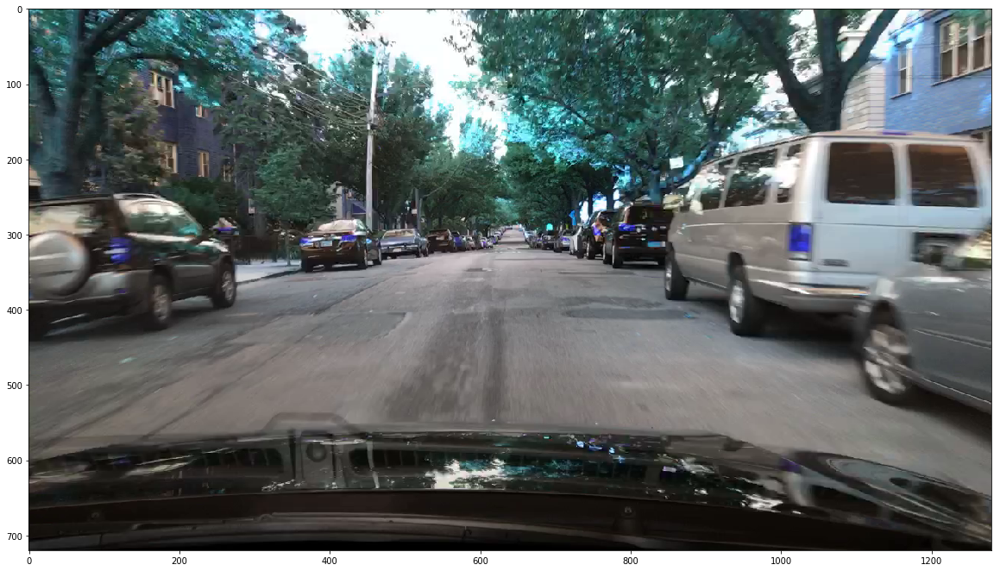

In [ ]:
plt.figure(figsize = (20,20))
plt.imshow(img)

In [ ]:
df[df['haveVideo'] == True].iloc[498502]

name                    00699de6-58847872-0000095.jpg
videoName                           00699de6-58847872
frameIndex                                         94
id                                              86561
category                                      bicycle
attributes.crowd                                False
attributes.occluded                              True
attributes.truncated                            False
box2d.x1                                      1065.45
box2d.x2                                      1112.43
box2d.y1                                      301.069
box2d.y2                                      331.282
haveVideo                                        True
Name: 741634, dtype: object

In [ ]:
og_name = '01c71072-718028b8'
vid_2_name = '01c71072-718028b8' #'00699de6-58847872'#'0252f2b5-1f4c92f2'

In [ ]:
test_vid = df[(df['videoName'] == vid_2_name)].copy()
# test_vid["video_frame"] = ((test_vid["frameIndex"]) * (1208/201) + 1).round().astype("int")

In [ ]:
test_vid[(test_vid['frameIndex'] == 5) & (test_vid['haveVideo'] == True)] 

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
739931,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86433.0,bus,False,False,True,831.616153,1279.507790,0.000000,559.560711,True
739932,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86434.0,car,False,True,True,0.000000,256.964969,173.096074,387.365543,True
739933,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86435.0,car,False,True,False,417.376249,831.195882,150.498074,519.823365,True
739934,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86436.0,pedestrian,False,False,False,206.643633,262.567415,213.137713,362.552696,True
739935,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86437.0,pedestrian,False,True,False,260.808959,275.951954,221.204207,286.901508,True
739936,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86438.0,pedestrian,False,True,False,274.787110,296.569722,226.562495,288.998225,True
739937,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86439.0,pedestrian,False,True,False,294.007065,306.237945,230.639455,288.881742,True
739938,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86440.0,pedestrian,False,False,False,298.666448,338.620656,213.283252,290.978468,True
739939,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86441.0,pedestrian,False,True,False,331.864551,348.405359,233.551570,288.415802,True
739940,00699de6-58847872-0000006.jpg,00699de6-58847872,5,86442.0,pedestrian,False,True,False,340.018469,359.820847,221.903112,283.989394,True


In [ ]:
test_vid[(test_vid['category'] == 'pedestrian') & (test_vid['haveVideo'] == True)]


,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
739846,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86436.0,pedestrian,False,False,False,194.417866,262.567415,213.137713,373.289154,True
739847,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86437.0,pedestrian,False,False,False,255.567156,291.094951,220.155844,288.299319,True
739848,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86438.0,pedestrian,False,True,False,292.259796,312.062174,230.639455,288.881742,True
739849,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86439.0,pedestrian,False,True,False,307.402791,319.633671,230.057032,288.299319,True
739850,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86440.0,pedestrian,False,False,False,314.391865,351.084506,217.826152,290.629011,True
739851,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86441.0,pedestrian,False,True,False,342.930586,359.820849,225.397650,286.552051,True
739852,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86442.0,pedestrian,False,True,False,351.084506,385.447455,225.980072,287.716896,True
739853,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86443.0,pedestrian,False,False,False,370.886884,383.117764,241.123067,286.552051,True
739854,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86444.0,pedestrian,False,False,False,382.535341,416.315867,228.892187,289.464165,True
739855,00699de6-58847872-0000001.jpg,00699de6-58847872,0,86445.0,pedestrian,False,True,False,384.865028,395.348640,240.191196,272.806876,True


In [ ]:
test_vid[(test_vid['frameIndex'] == 201)]

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
743989,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86491.0,bus,False,True,False,751.175328,790.372191,249.292938,283.707602,True
743990,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86617.0,car,False,False,False,733.956294,759.400485,264.231622,283.940728,True
743991,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86672.0,rider,False,True,False,548.845862,599.769705,233.743910,291.869062,True
743992,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86677.0,pedestrian,False,True,False,173.370093,253.416263,198.927387,273.609439,True
743993,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86682.0,pedestrian,False,True,False,123.598191,199.101908,190.764637,326.441158,True
743994,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86688.0,car,False,True,False,721.874427,736.043626,267.647942,280.615038,True
743995,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86690.0,pedestrian,False,True,False,71.528904,108.860545,209.916364,329.259060,True
743996,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86705.0,pedestrian,False,True,False,274.951765,300.105081,221.916245,268.762002,True
743997,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86716.0,car,False,True,False,708.434674,721.616558,267.537319,280.947216,True
743998,00699de6-58847872-0000202.jpg,00699de6-58847872,201,86723.0,pedestrian,False,True,False,323.469452,362.988371,220.194600,304.323587,True


In [ ]:
test_vid['frameIndex'].max()

201

In [ ]:
ipd.Video(f'bdd100k_videos_train_00/bdd100k/videos/train/{vid_2_name}.mov', width=700)

In [ ]:
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")
    plt.show()

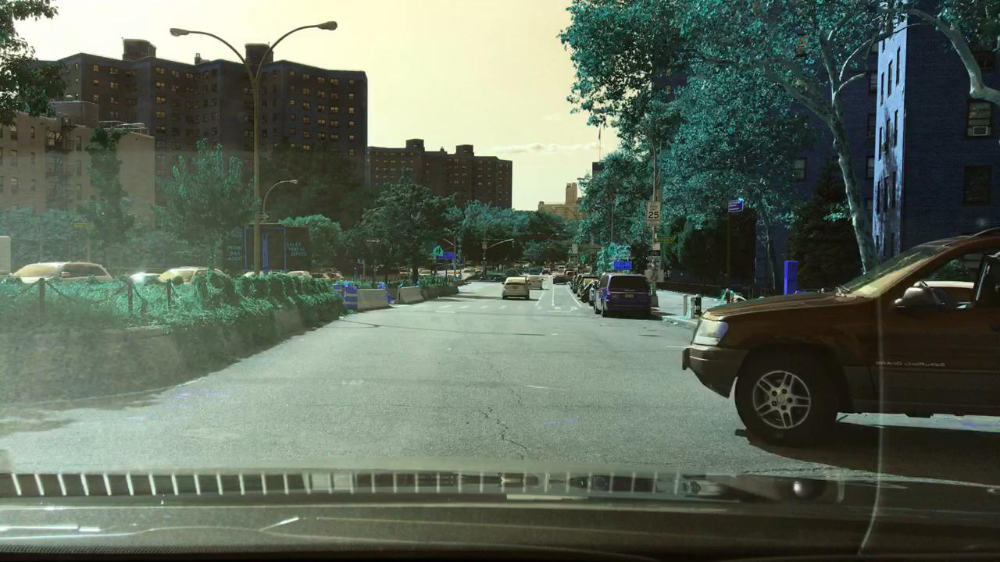

In [ ]:
img = Image.open("frames/01c71072-718028b8-0000202.jpg")
img

In [ ]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 100, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

In [ ]:
np.arange(0, 1208, 6)

array([   0,    6,   12,   18,   24,   30,   36,   42,   48,   54,   60,
         66,   72,   78,   84,   90,   96,  102,  108,  114,  120,  126,
        132,  138,  144,  150,  156,  162,  168,  174,  180,  186,  192,
        198,  204,  210,  216,  222,  228,  234,  240,  246,  252,  258,
        264,  270,  276,  282,  288,  294,  300,  306,  312,  318,  324,
        330,  336,  342,  348,  354,  360,  366,  372,  378,  384,  390,
        396,  402,  408,  414,  420,  426,  432,  438,  444,  450,  456,
        462,  468,  474,  480,  486,  492,  498,  504,  510,  516,  522,
        528,  534,  540,  546,  552,  558,  564,  570,  576,  582,  588,
        594,  600,  606,  612,  618,  624,  630,  636,  642,  648,  654,
        660,  666,  672,  678,  684,  690,  696,  702,  708,  714,  720,
        726,  732,  738,  744,  750,  756,  762,  768,  774,  780,  786,
        792,  798,  804,  810,  816,  822,  828,  834,  840,  846,  852,
        858,  864,  870,  876,  882,  888,  894,  9

In [ ]:
list(df[df['haveVideo'] == True]['videoName'].drop_duplicates())[:20]

['01c71072-718028b8',
 '0252f2b5-1f4c92f2',
 '0153f03b-8fbdc1ad',
 '011f8481-b14725fa',
 '0153f03b-3b26c404',
 '01118704-e91b1b1c',
 '006a7635-c42f9f97',
 '00d1bafa-1b47b41c',
 '00207869-046fa443',
 '01853f47-6975b587',
 '024ac038-ffa0ed50',
 '01c88f41-3ddab5b5',
 '01ca43f9-d9cae3f4',
 '01a4deab-fd589c6f',
 '00ce8219-d0b5582e',
 '0231c6df-b84bd28f',
 '02995fe4-158af38b',
 '01ff9753-487eb0bd',
 '00f89335-2ef7949d',
 '00067cfb-5adfaaa7']

In [ ]:
nums = np.arange(1191, 0, -6)
len(nums), nums

(199, array([1191, 1185, 1179, 1173, 1167, 1161, 1155, 1149, 1143, 1137, 1131,
        1125, 1119, 1113, 1107, 1101, 1095, 1089, 1083, 1077, 1071, 1065,
        1059, 1053, 1047, 1041, 1035, 1029, 1023, 1017, 1011, 1005,  999,
         993,  987,  981,  975,  969,  963,  957,  951,  945,  939,  933,
         927,  921,  915,  909,  903,  897,  891,  885,  879,  873,  867,
         861,  855,  849,  843,  837,  831,  825,  819,  813,  807,  801,
         795,  789,  783,  777,  771,  765,  759,  753,  747,  741,  735,
         729,  723,  717,  711,  705,  699,  693,  687,  681,  675,  669,
         663,  657,  651,  645,  639,  633,  627,  621,  615,  609,  603,
         597,  591,  585,  579,  573,  567,  561,  555,  549,  543,  537,
         531,  525,  519,  513,  507,  501,  495,  489,  483,  477,  471,
         465,  459,  453,  447,  441,  435,  429,  423,  417,  411,  405,
         399,  393,  387,  381,  375,  369,  363,  357,  351,  345,  339,
         333,  327,  321,  315,  

In [ ]:
df[(df['haveVideo']==True) &(df['frameIndex'] > 203)]['videoName'].drop_duplicates()

613640     0051e391-d32a618e
813201     012a9c41-9423165c
1380580    00fcfec9-8accd82b
1476159    00091078-cedbfea7
1512540    01c5cd64-192464e1
1837207    00054602-3bf57337
2616879    007aeb45-c601742b
Name: videoName, dtype: object

211
1260
5.966824644549763 5
5


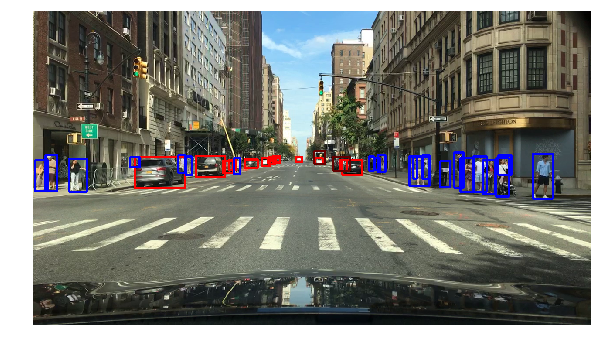

11


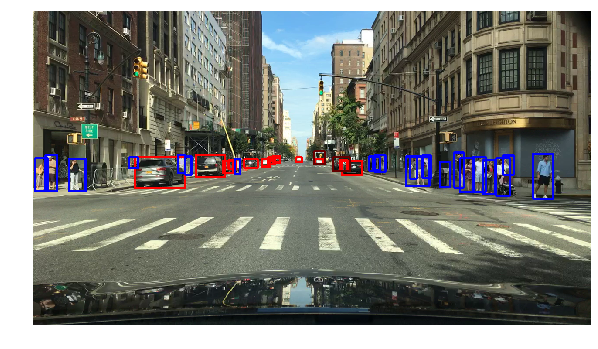

17


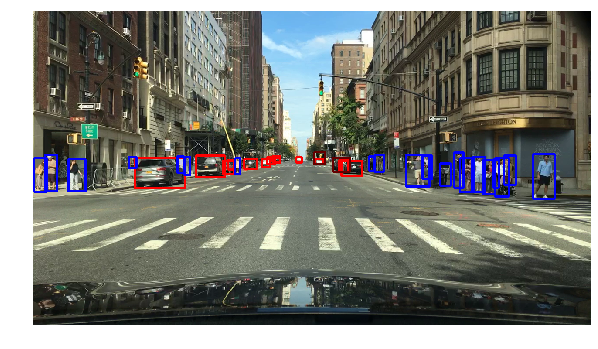

23


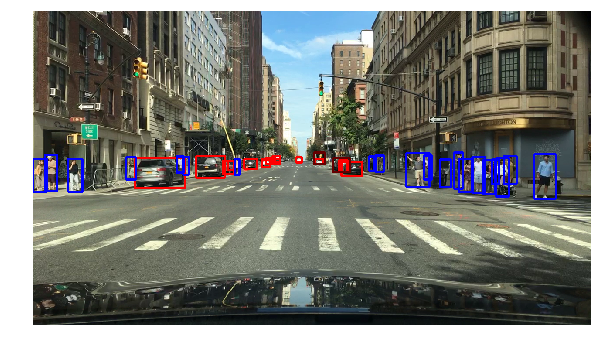

29


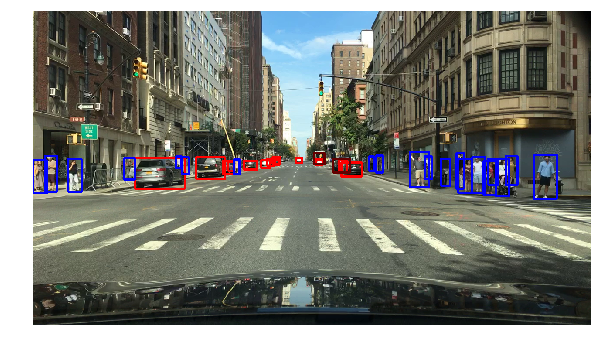

35


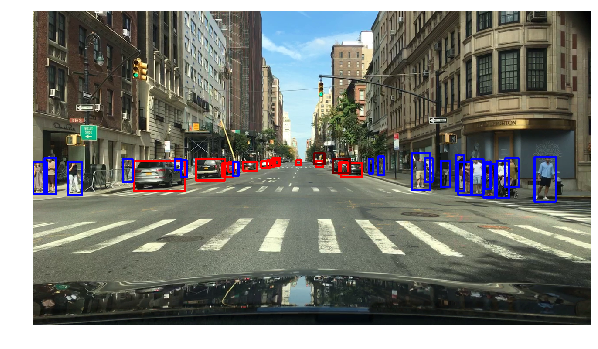

41


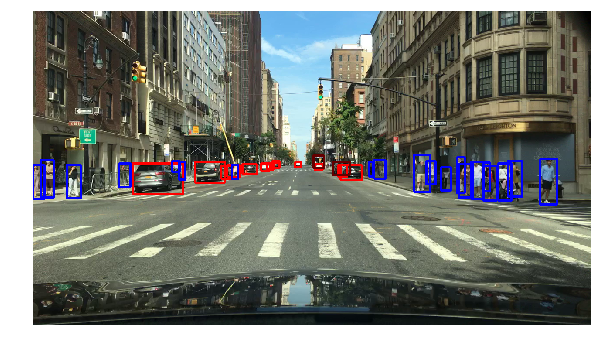

47


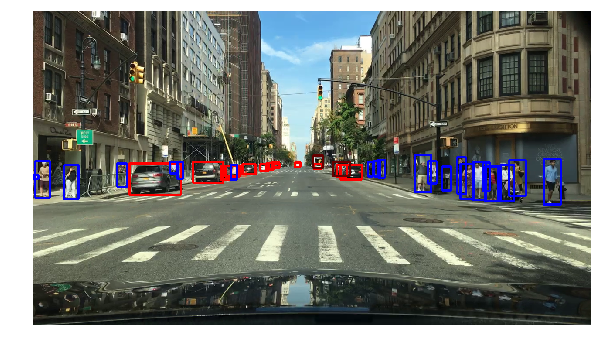

In [ ]:
vid_2_name = '007aeb45-c601742b' #'00067cfb-5adfaaa7' #'00f89335-2ef7949d' #'00ce8219-d0b5582e' #'01c88f41-3ddab5b5' #'01a4deab-fd589c6f' #'006a7635-c42f9f97' #'01118704-e91b1b1c' #'00699de6-58847872'#'0252f2b5-1f4c92f2' #'01c71072-718028b8'

test_vid = df[(df['videoName'] == vid_2_name)].copy()
df_frame_max = test_vid['frameIndex'].max()
print(df_frame_max)

capture = cv.VideoCapture(f'bdd100k_videos_train_00/bdd100k/videos/train/{vid_2_name}.mov')
vid_frame_max = int(capture.get(cv.CAP_PROP_FRAME_COUNT))
print(vid_frame_max)
print((vid_frame_max-1)/df_frame_max, (vid_frame_max-1)%6)
mod_val = (vid_frame_max-1)%6
for i in range(int(capture.get(cv.CAP_PROP_FRAME_COUNT))):
    ret, img = capture.read()
    if i % 6 == mod_val and i < 50:  #i % 6 == 1:
        print(i)
        img_example = img.copy()
        frame_labels = test_vid[(test_vid['frameIndex'] == int(i / 6) + 1)] #video_labels.query('video_frame == 1035')
        for i, d in frame_labels.iterrows():
            pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
            pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
            color = color_map[d['category']]
            cv.rectangle(img_example, pt1, pt2, color, 3)
        display_cv2_img(img_example)
#     if i == 0 or i == 5 or i == 6:
#         print(i)
#         img_example = img.copy()
#         frame_labels = test_vid[(test_vid['frameIndex'] == 0)] #video_labels.query('video_frame == 1035')
#         for i, d in frame_labels.iterrows():
#             pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
#             pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
#             color = color_map[d['category']]
#             cv.rectangle(img_example, pt1, pt2, color, 3)
#         display_cv2_img(img_example)
#     if i == 5 or i == 31:
#         print(i)
#         img_example = img.copy()
#         frame_labels = test_vid[(test_vid['frameIndex'] == 5)] #video_labels.query('video_frame == 1035')
#         for i, d in frame_labels.iterrows():
#             pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
#             pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
#             color = color_map[d['category']]
#             cv.rectangle(img_example, pt1, pt2, color, 3)
#         display_cv2_img(img_example)
#     if i == 201 or i == 1206 or i == 1207: #i == 5 or i == 60:
#         print(i)
#         img_example = img.copy()
#         frame_labels = test_vid[(test_vid['frameIndex'] == 201)] #video_labels.query('video_frame == 1035')
#         for i, d in frame_labels.iterrows():
#             pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
#             pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
#             color = color_map[d['category']]
#             cv.rectangle(img_example, pt1, pt2, color, 3)
#         display_cv2_img(img_example)
#         plt.figure(figsize = (20,20))
#         plt.imshow(img)

In [ ]:
test_vid2 = df[(df['videoName'] == '01c71072-718028b8')].copy()
test_vid2["video_frame"] = (test_vid2["frameIndex"] * (11.9)).round().astype("int")

In [ ]:
df[(df['videoName'] == '010fc651-7cf4bc7d') & (df['frameIndex'] == 0)]

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
1588272,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62056.0,car,False,False,True,0.868385,278.751696,241.845319,444.179104,True
1588273,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62057.0,car,False,False,True,1095.892514,1280.000000,280.922659,547.255278,True
1588274,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62058.0,car,False,True,True,842.333786,1280.000000,162.822252,440.705563,True
1588275,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62059.0,car,False,False,False,358.643148,469.796472,277.449118,349.525102,True
1588276,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62060.0,car,False,True,False,240.542741,279.620081,274.843962,305.237449,True
1588277,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62061.0,car,False,True,False,761.573948,859.701493,255.739484,346.051560,True
1588278,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62062.0,car,False,True,False,466.280600,531.947270,291.343284,333.529993,True
1588279,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62063.0,car,False,True,False,729.419702,781.546811,267.028494,333.057571,True
1588280,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62064.0,car,False,True,False,530.530003,570.529172,290.539583,326.078697,True
1588281,010fc651-7cf4bc7d-0000001.jpg,010fc651-7cf4bc7d,0,62065.0,car,False,True,False,719.891452,736.390773,287.869742,324.341927,True


In [ ]:
df[(df['videoName'] == '010fc651-7cf4bc7d')]['frameIndex'].nunique()

202

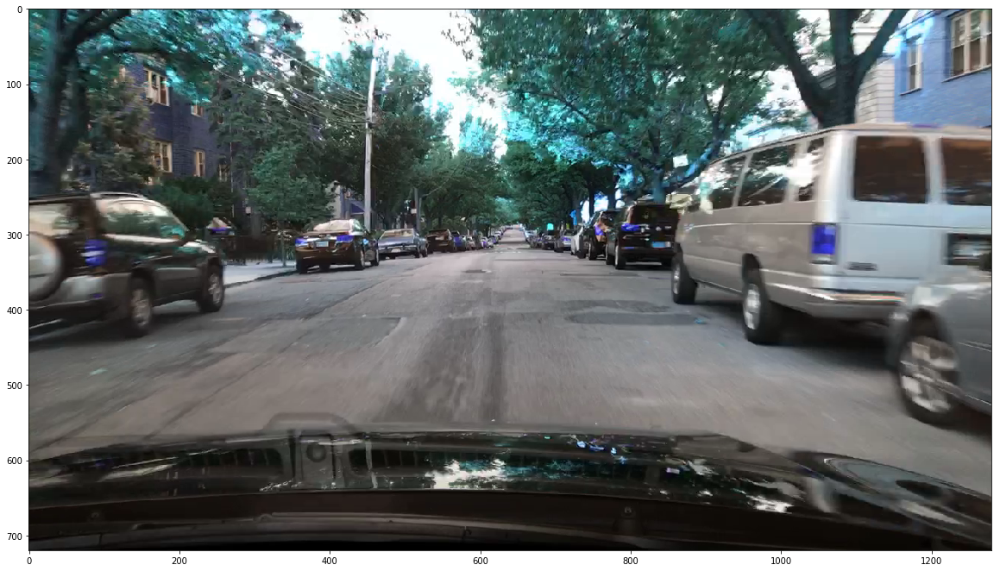

In [ ]:
ret, img = capture.read()
plt.figure(figsize = (20,20))
plt.imshow(img)

In [ ]:
df[(df['videoName'] == '010fc651-7cf4bc7d') & (df['frameIndex'] == 1)]

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
1588287,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62056.0,car,False,False,True,0.000000,260.515604,236.635007,445.047490,True
1588288,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62057.0,car,False,False,True,1141.058345,1280.000000,306.105834,569.226594,True
1588289,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62059.0,car,False,False,False,352.195626,467.042026,278.317503,353.289401,True
1588290,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62058.0,car,False,True,True,851.886024,1280.000000,149.796472,450.257802,True
1588291,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62060.0,car,False,True,False,234.960264,274.533824,271.122311,310.695871,True
1588292,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62061.0,car,False,True,False,762.442334,865.099325,255.462243,347.788331,True
1588293,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62062.0,car,False,True,False,463.760700,532.668540,290.337785,334.695222,True
1588294,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62063.0,car,False,True,False,731.663707,789.700760,265.383107,334.829154,True
1588295,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62064.0,car,False,True,False,526.652776,569.310010,290.397325,326.491908,True
1588296,010fc651-7cf4bc7d-0000002.jpg,010fc651-7cf4bc7d,1,62065.0,car,False,True,False,722.887381,741.861601,286.957938,331.158752,True


In [ ]:
# movie_files = os.listdir('bdd100k_videos_train_00/bdd100k/videos/train')
# movies_in_df = list(df['videoName'].unique())
# movie_files_cleaned = [s[:-4] for s in movie_files]

# frames = {}

# for m in movie_files_cleaned:
#     if m in movies_in_df:
#         capture = cv.VideoCapture(f'bdd100k_videos_train_00/bdd100k/videos/train/{m}.mov')
#         n_frames = df[(df['videoName'] == m)]['frameIndex'].nunique() #int(capture.get(cv.CAP_PROP_FRAME_COUNT))
#         frames[m] = []
#         for frame in range(n_frames):
#             # TODO
#             # add each frame to dict

In [ ]:
movie_files = os.listdir('bdd100k_videos_train_00/bdd100k/videos/train')
movies_in_df = list(df['videoName'].unique())
movie_files_cleaned = [s[:-4] for s in movie_files]

In [ ]:
'''
save each frame of every video into the folder "frames_v2"
'''

# to keep count of progress of saving frames for all videos into the folder "frames"
numMovies = len(movie_files_cleaned)


# iterate through every video we have saved
for i, m in tqdm.tqdm(enumerate(movie_files_cleaned)):
#     print(f"{i+1} / {numMovies}")
    # if this video is in the dataframe
    if m in movies_in_df:
        # load in the video
        capture = cv.VideoCapture(f'bdd100k_videos_train_00/bdd100k/videos/train/{m}.mov')
        # count number of frames of the video 
        n_frames = int(capture.get(cv.CAP_PROP_FRAME_COUNT)) 
        for frame in range(n_frames):
            ret, img = capture.read()
            if frame % 6 == 1:
                frameNum = int(frame / 6) + 1
                # convert the array into an image:
                img = Image.fromarray(img)


                # if it has reached ned of video --> break
                if ret == False:
                    break
                # otherwise, add it to the folder of frames
                # Save the image to the folder with a new name (if desired)
                # file path:
                path = 'frames_v2/'
                if frameNum+1 < 10:
                    # output_path = os.path.join(path, f'{m}-000000{frame}.jpg')
                    file_name = f'{m}-000000{frameNum+1}.jpg'
                elif frameNum+1 < 100 and frameNum+1 >= 10:
                    # output_path = os.path.join(path, f'{m}-00000{frame}.jpg')
                    file_name = f'{m}-00000{frameNum+1}.jpg'
                elif frameNum+1 < 1000 and frameNum+1 >= 100:
                    # output_path = os.path.join(path, f'{m}-0000{frame}.jpg')
                    file_name = f'{m}-0000{frameNum+1}.jpg'
                # img.save(output_path)
                img.save(os.path.join(path, file_name))


0it [00:00, ?it/s]
1it [00:06,  6.40s/it]
2it [00:14,  6.77s/it]
7it [00:21,  5.21s/it]
8it [00:28,  5.65s/it]
9it [00:35,  6.01s/it]
10it [00:43,  6.56s/it]
11it [00:49,  6.56s/it]
12it [00:56,  6.72s/it]
13it [01:04,  6.93s/it]
14it [01:12,  7.21s/it]
15it [01:19,  7.29s/it]
16it [01:26,  7.03s/it]
17it [01:32,  6.99s/it]
18it [01:40,  7.05s/it]
19it [01:46,  6.94s/it]
20it [01:54,  7.07s/it]
21it [02:01,  7.05s/it]
22it [02:08,  6.98s/it]
23it [02:15,  7.05s/it]
24it [02:22,  7.01s/it]
25it [02:29,  7.24s/it]
26it [02:36,  7.17s/it]
27it [02:44,  7.29s/it]
28it [02:51,  7.14s/it]
29it [02:58,  7.09s/it]
30it [03:05,  7.27s/it]
31it [03:13,  7.49s/it]
33it [03:20,  6.30s/it]
34it [03:27,  6.44s/it]
35it [03:34,  6.65s/it]
37it [03:42,  5.79s/it]
38it [03:50,  6.32s/it]
39it [03:57,  6.63s/it]
40it [04:04,  6.68s/it]
41it [04:11,  6.76s/it]
42it [04:18,  6.83s/it]
43it [04:25,  7.01s/it]
44it [04:32,  7.03s/it]
45it [04:40,  7.16s/it]
46it [04:47,  7.17s/it]
47it [04:54,  7.28s/it]
4

610it [1:08:00,  7.06s/it]
611it [1:08:07,  7.01s/it]
612it [1:08:14,  7.05s/it]
613it [1:08:21,  6.86s/it]
614it [1:08:28,  6.84s/it]
615it [1:08:34,  6.72s/it]
616it [1:08:42,  6.96s/it]
617it [1:08:49,  7.09s/it]
618it [1:08:53,  6.04s/it]
619it [1:09:00,  6.34s/it]
620it [1:09:07,  6.55s/it]
621it [1:09:14,  6.74s/it]
622it [1:09:21,  6.75s/it]
623it [1:09:28,  6.81s/it]
624it [1:09:35,  7.04s/it]
625it [1:09:42,  7.01s/it]
626it [1:09:49,  6.91s/it]
627it [1:09:56,  6.98s/it]
628it [1:10:03,  7.08s/it]
629it [1:10:11,  7.23s/it]
630it [1:10:18,  7.27s/it]
631it [1:10:25,  7.10s/it]
632it [1:10:32,  7.17s/it]
633it [1:10:39,  7.05s/it]
634it [1:10:46,  7.14s/it]
635it [1:10:53,  7.04s/it]
636it [1:11:00,  6.88s/it]
637it [1:11:03,  5.88s/it]
638it [1:11:10,  6.06s/it]
639it [1:11:17,  6.51s/it]
640it [1:11:24,  6.71s/it]
641it [1:11:32,  6.92s/it]
642it [1:11:38,  6.82s/it]
643it [1:11:45,  6.83s/it]
644it [1:11:52,  6.91s/it]
645it [1:11:56,  5.86s/it]
646it [1:12:03,  6.16s/it]
6

In [ ]:
frame_files = os.listdir('frames')

In [ ]:
len(frame_files), len(df[df['haveVideo'] == True]['name'].drop_duplicates())

(190469, 190469)

### Category exploration on relevant data

In [ ]:
X_train_df = pd.read_csv('train_videos_small.csv', header = None, index_col = 0)
X_test_df = pd.read_csv('test_videos_small.csv', header = None, index_col = 0)

X_train_list = list(X_train_df[1])
X_test_list = list(X_test_df[1])

len(X_train_list), len(X_test_list)

(80, 20)

In [ ]:
jpegs = os.listdir('frames_v2')
df_cleaned = df[df['name'].isin(jpegs)].copy()

In [ ]:
train_df = df_cleaned[df_cleaned['videoName'].isin(X_train_list)].copy()
test_df = df_cleaned[df_cleaned['videoName'].isin(X_test_list)].copy()

In [ ]:
videos_ov = train_df[train_df['category'] == 'other vehicle']['videoName'].unique()
pics_ov = train_df[(train_df['category'] == 'other vehicle')]['name'].unique()

In [ ]:
len(pics_ov), len(videos_ov)

(698, 17)

In [ ]:
train_df.head(2)

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
89752,003e23ee-67d25f19-0000002.jpg,003e23ee-67d25f19,1,106589.0,car,False,False,False,204.398952,660.434731,196.266663,518.101687,True
89753,003e23ee-67d25f19-0000002.jpg,003e23ee-67d25f19,1,106590.0,car,False,True,True,654.056608,1280.000000,201.599996,534.046994,True


In [ ]:
vid_test = '026c5058-acd78182' #videos_ov[0]

In [ ]:
ipd.Video(f'bdd100k_videos_train_00/bdd100k/videos/train/{vid_test}.mov', width=700)

In [ ]:
vid_test

'026c5058-acd78182'

In [ ]:
pics_ov[350:400]

array(['01c3e892-a4a8f9ec-0000118.jpg', '01c3e892-a4a8f9ec-0000119.jpg',
       '01c3e892-a4a8f9ec-0000120.jpg', '01c3e892-a4a8f9ec-0000121.jpg',
       '01c3e892-a4a8f9ec-0000122.jpg', '01c3e892-a4a8f9ec-0000123.jpg',
       '01c3e892-a4a8f9ec-0000124.jpg', '01c3e892-a4a8f9ec-0000125.jpg',
       '01c3e892-a4a8f9ec-0000126.jpg', '01c3e892-a4a8f9ec-0000127.jpg',
       '01c3e892-a4a8f9ec-0000128.jpg', '01c3e892-a4a8f9ec-0000129.jpg',
       '01c3e892-a4a8f9ec-0000130.jpg', '01c3e892-a4a8f9ec-0000131.jpg',
       '01c3e892-a4a8f9ec-0000132.jpg', '01c3e892-a4a8f9ec-0000133.jpg',
       '01c3e892-a4a8f9ec-0000134.jpg', '01c3e892-a4a8f9ec-0000135.jpg',
       '01c3e892-a4a8f9ec-0000136.jpg', '00ed2e85-82bdd22b-0000009.jpg',
       '00ed2e85-82bdd22b-0000010.jpg', '00ed2e85-82bdd22b-0000011.jpg',
       '00ed2e85-82bdd22b-0000012.jpg', '00ed2e85-82bdd22b-0000013.jpg',
       '00ed2e85-82bdd22b-0000014.jpg', '028b5d16-af6a6275-0000153.jpg',
       '028b5d16-af6a6275-0000154.jpg', '028b5d16-a

In [ ]:
# pics_ov[149:255]

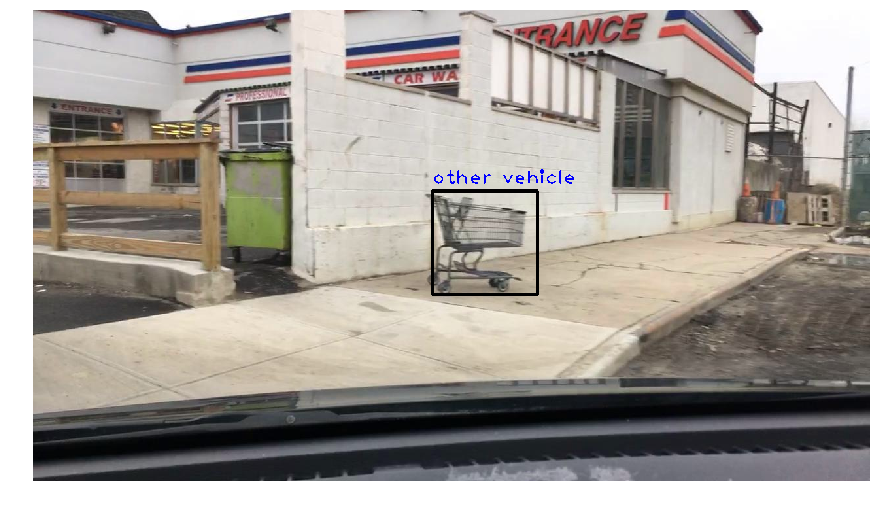

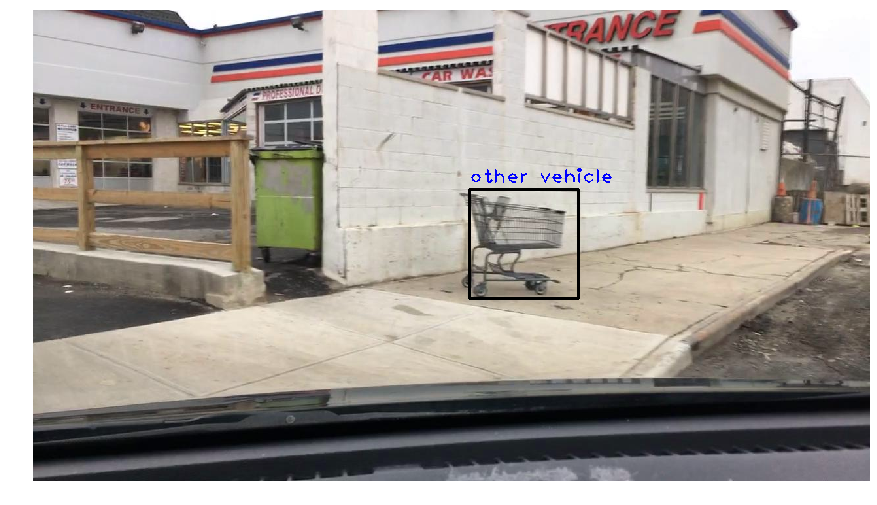

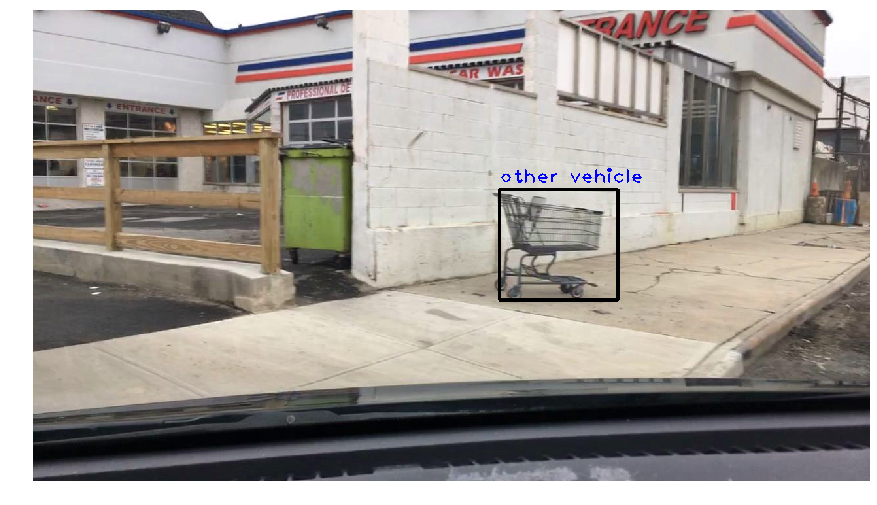

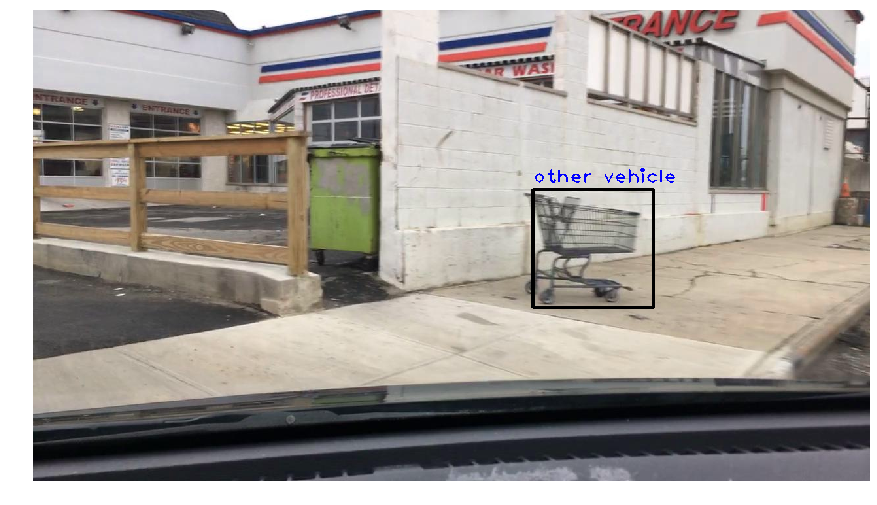

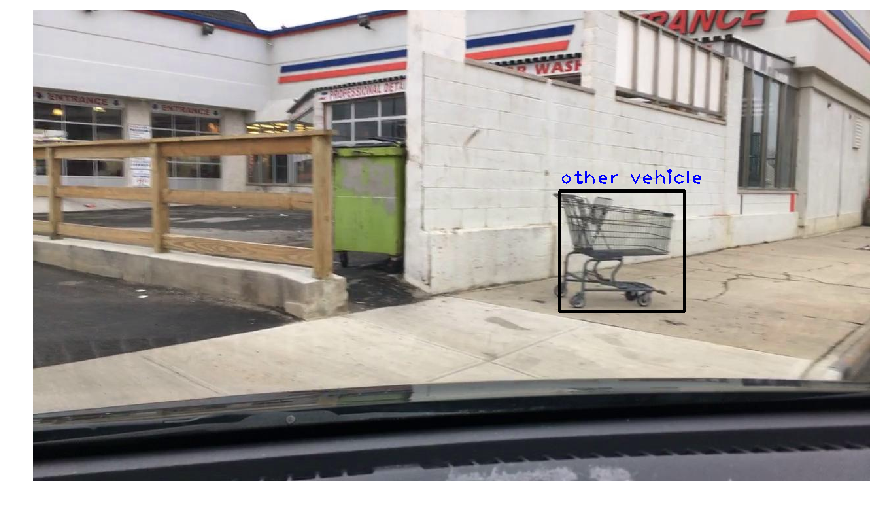

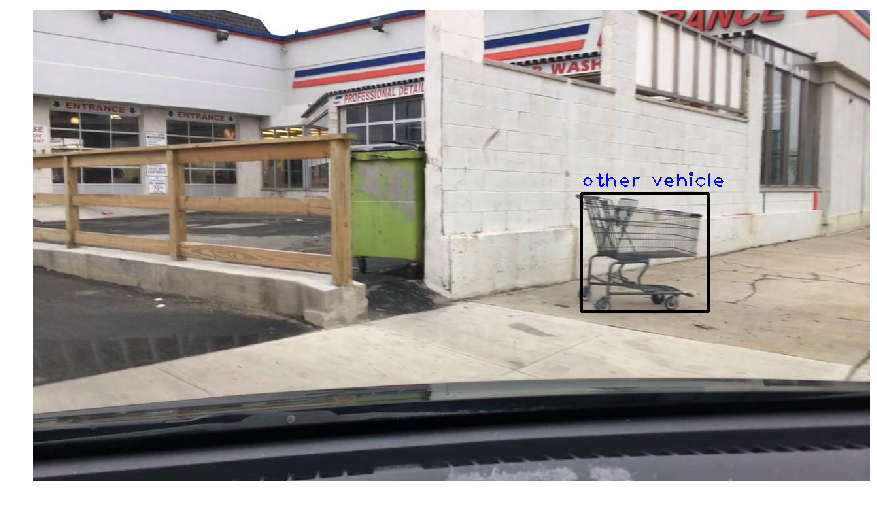

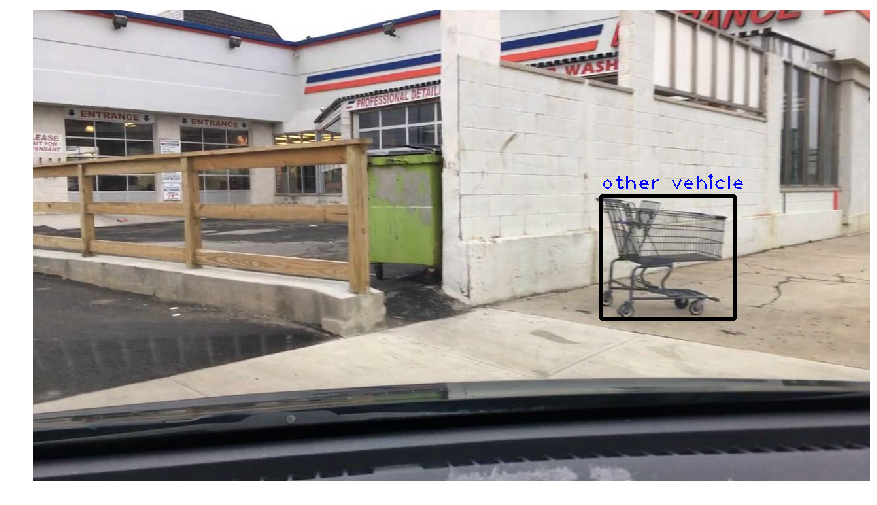

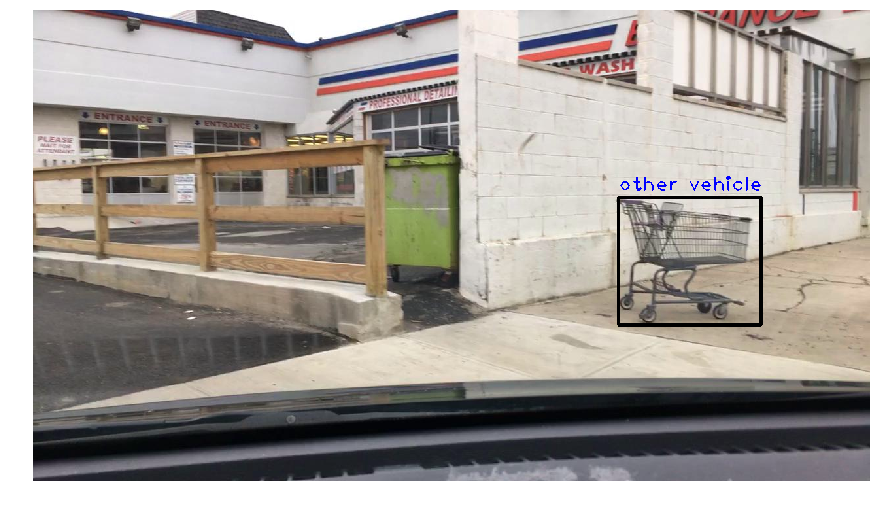

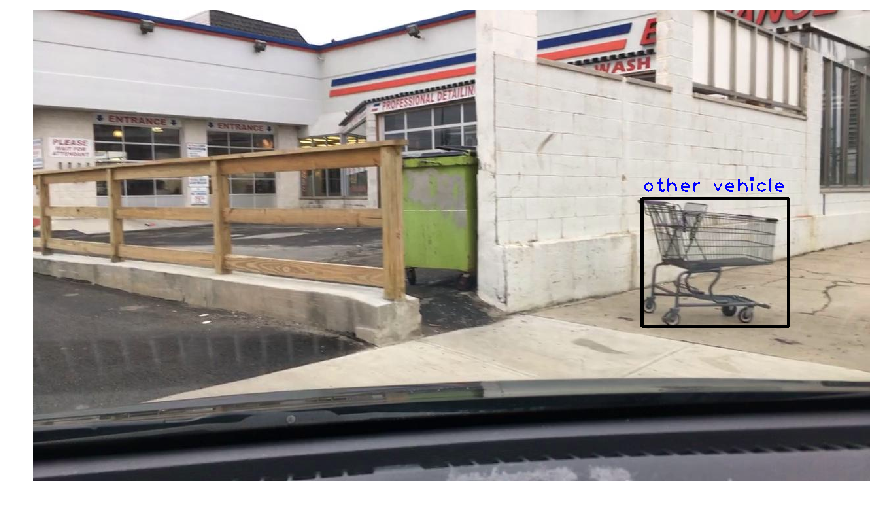

In [ ]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 0),
    "rider": (200, 100, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}


for i, pic in enumerate(pics_ov):
    img = cv.imread(f'frames_v2/{pic}')
    img = np.array(img)
    img_example = img.copy()
#     img_example = cv.imread(f'frames_v2/{pic}')
    if i > 415 and i < 425: #>= 75 and i < 150: 
#         print(i, pic)
#         print(img_example)
        frame_labels = train_df[(train_df['name'] == pic)] 
        for i, d in frame_labels.iterrows():
            pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
            pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
            color = color_map[d['category']]
            cv.rectangle(img_example, pt1, pt2, color, 3)
            label = d['category']
            if label == 'other vehicle':
                cv.putText(img_example, label, (pt1[0], pt1[1] - 10), cv.FONT_HERSHEY_PLAIN, 2, (0, 0, 255), 2)
        fig, ax = plt.subplots(figsize=(15,15))
        ax.imshow(img_example)
        ax.axis("off")
        plt.show()

In [ ]:
videos_trailer = train_df[train_df['category'] == 'trailer']['videoName'].unique()
pics_trailer = train_df[(train_df['category'] == 'trailer')]['name'].unique()

In [ ]:
len(pics_trailer), len(videos_trailer)

(143, 2)

In [ ]:
videos_trailer

array(['02927def-14c4c3cb', '025022b5-e92fb84b'], dtype=object)

In [ ]:
pics_trailer[-10:]

array(['025022b5-e92fb84b-0000129.jpg', '025022b5-e92fb84b-0000130.jpg',
       '025022b5-e92fb84b-0000131.jpg', '025022b5-e92fb84b-0000132.jpg',
       '025022b5-e92fb84b-0000133.jpg', '025022b5-e92fb84b-0000134.jpg',
       '025022b5-e92fb84b-0000135.jpg', '025022b5-e92fb84b-0000136.jpg',
       '025022b5-e92fb84b-0000137.jpg', '025022b5-e92fb84b-0000138.jpg'],
      dtype=object)

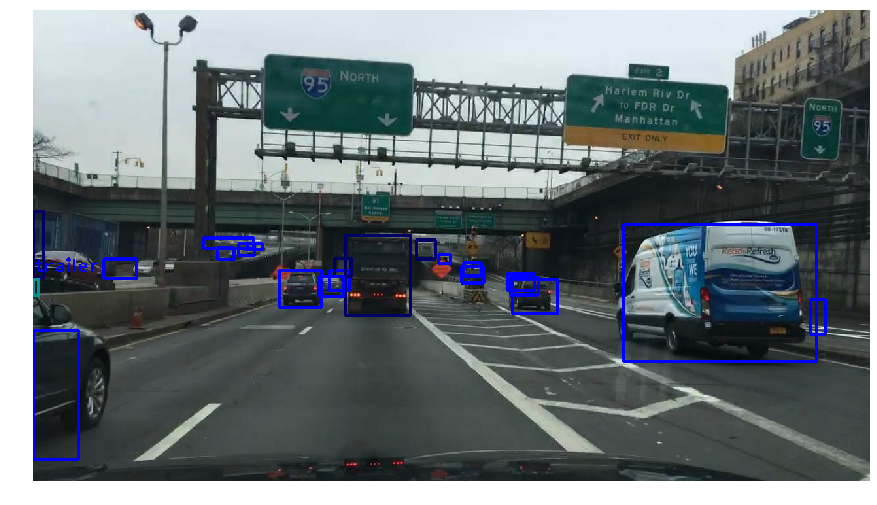

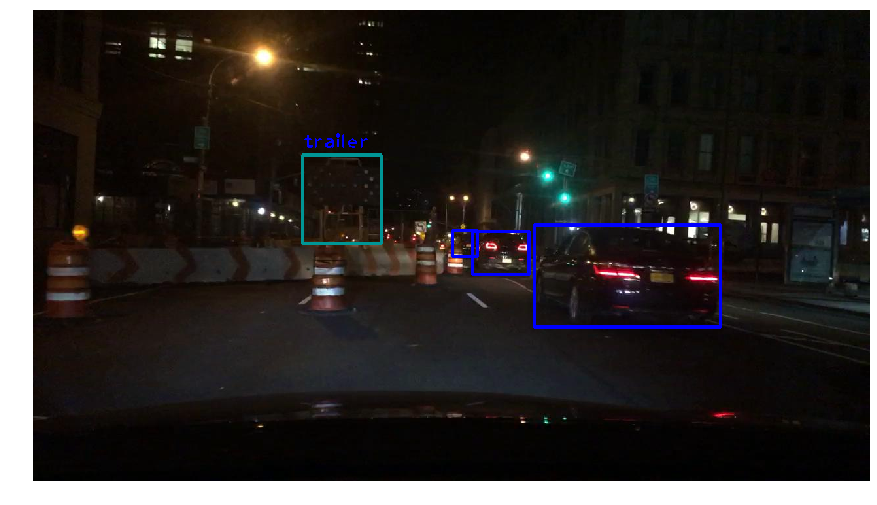

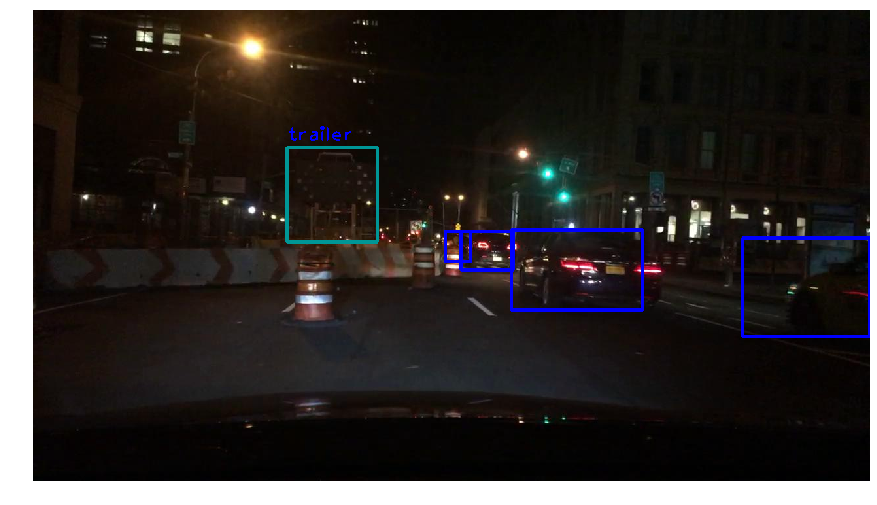

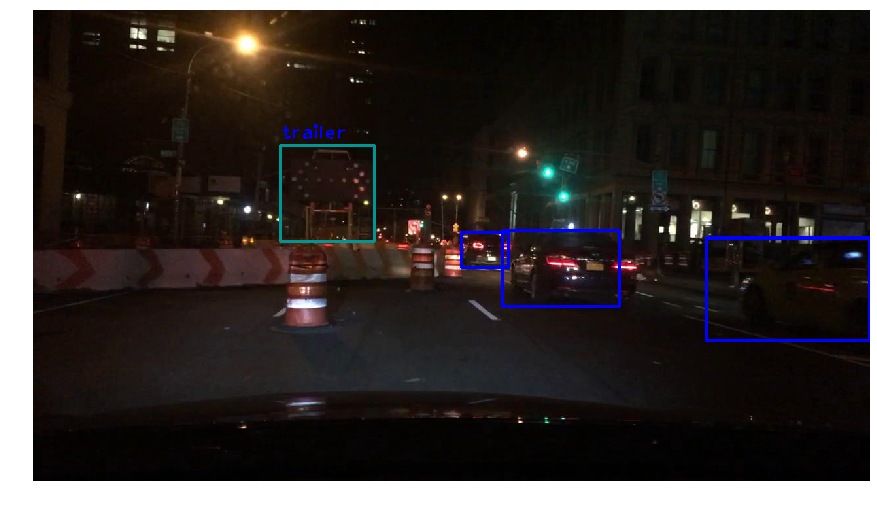

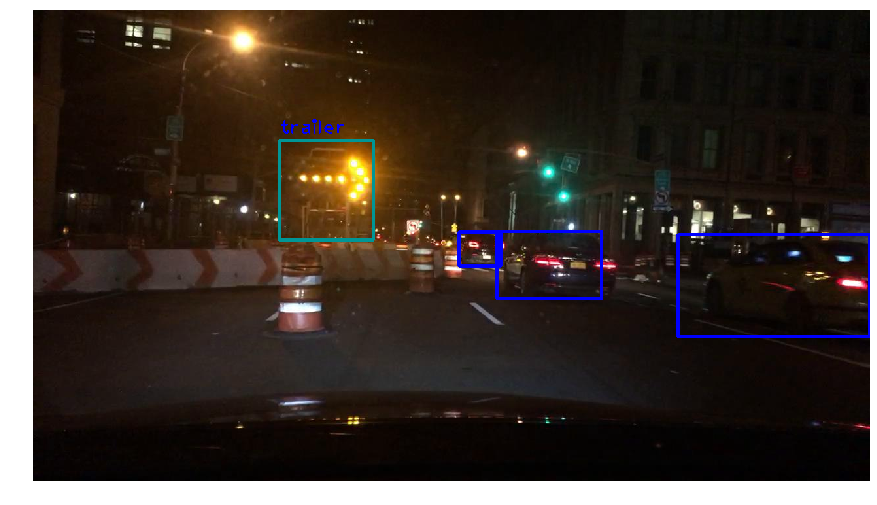

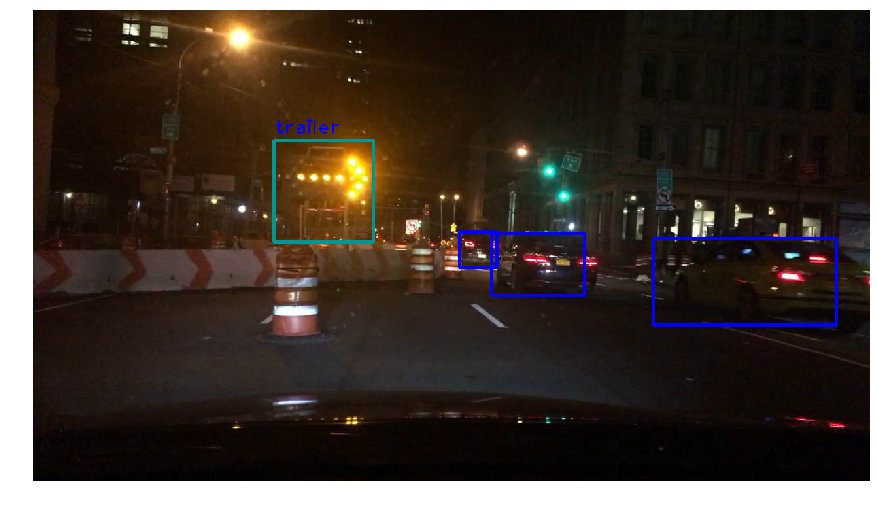

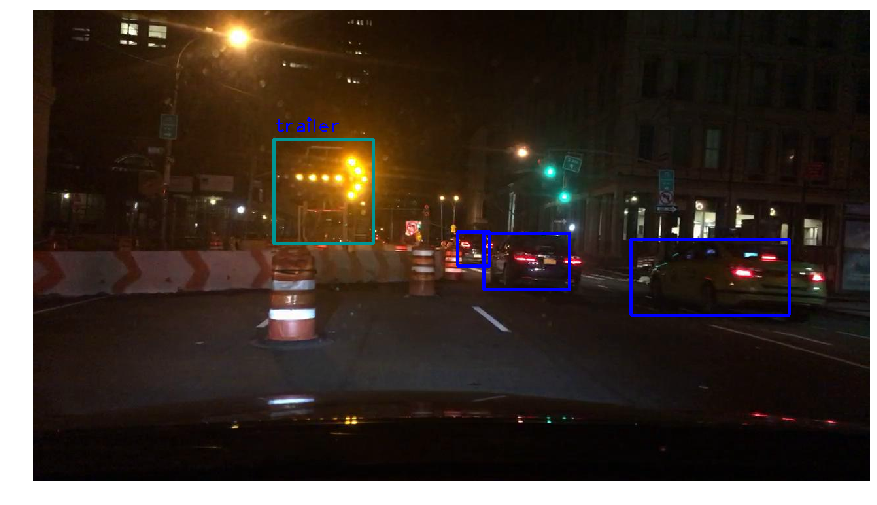

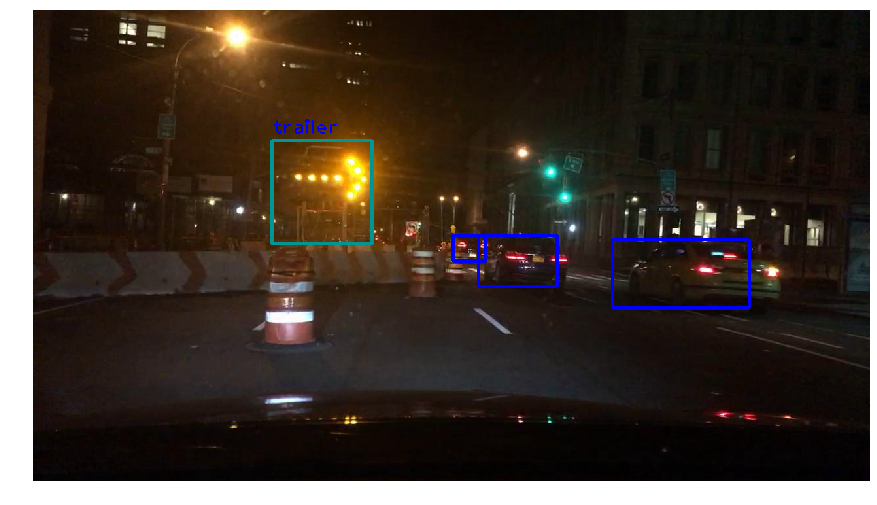

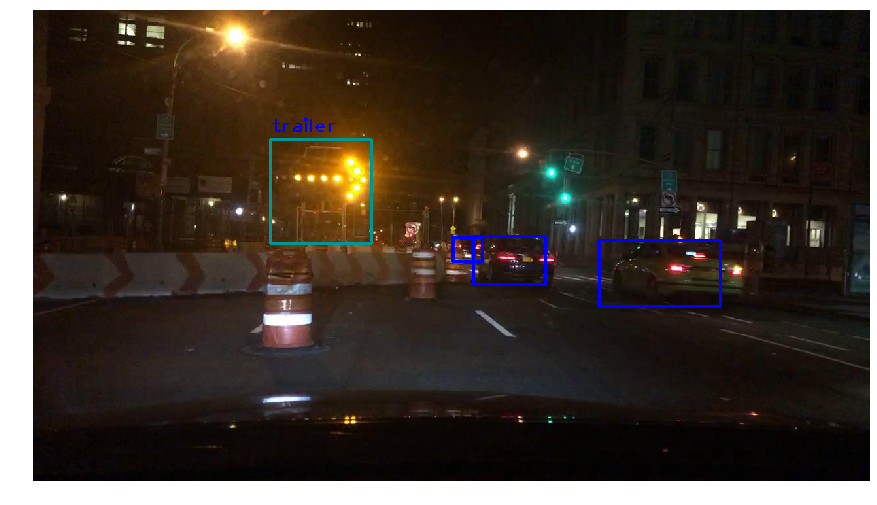

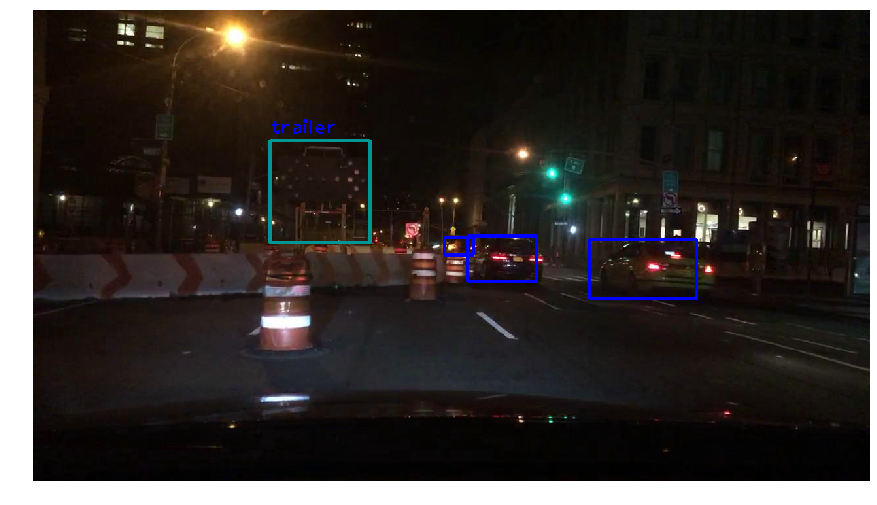

In [ ]:
for i, pic in enumerate(pics_trailer):
    img = cv.imread(f'frames_v2/{pic}')
    img = np.array(img)
    img_example = img.copy()
#     img_example = cv.imread(f'frames_v2/{pic}')
    if i >= 5 and i < 15: #>= 75 and i < 150: 
#         print(i, pic)
#         print(img_example)
        frame_labels = train_df[(train_df['name'] == pic)] 
        for i, d in frame_labels.iterrows():
            pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
            pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
            color = color_map[d['category']]
            cv.rectangle(img_example, pt1, pt2, color, 3)
            label = d['category']
            if label == 'trailer':
                cv.putText(img_example, label, (pt1[0], pt1[1] - 10), cv.FONT_HERSHEY_PLAIN, 2, (0, 0, 255), 2)
        fig, ax = plt.subplots(figsize=(15,15))
        ax.imshow(img_example)
        ax.axis("off")
        plt.show()

In [ ]:
ipd.Video(f'bdd100k_videos_train_00/bdd100k/videos/train/025022b5-e92fb84b.mov', width=700)